# Pre-processing & Exploratory Data Analysis

## Steps:
1. Converting .csv to GeoDataFrame.
2. Removing all measurments with pm2.5 <0.5 and >150 ug/m3.
3. Removing all measurments with avg. speed >45 km/h.
4. Removing all measurments outside of Utrecht Province.  
5. Descriptive statistics.  


In [2]:
# Import packages
import pandas as pd 
import numpy as np 
import geopandas as gpd 
import matplotlib.pyplot as plt

from tqdm import tqdm
import requests
from bs4 import BeautifulSoup
import io
import json

## 1. Convert .csv to GeoDataFrame

In [3]:
#snuffel1 = pd.read_csv("../data/external/resource_2019_05_27_2019_06_03.csv")
#snuffel1['recording_time'] = pd.to_datetime(snuffel1['recording_time'], format="%Y-%m-%d %H:%M:%S")

#snuffel2 = pd.read_csv("../data/external/resource_2020_05_11_2020_05_18.csv")
#snuffel2['recording_time'] = pd.to_datetime(snuffel2['recording_time'], format="%Y-%m-%d %H:%M:%S")

#snuffel3 = pd.read_csv("../data/external/resource_2020_09_14_2020_09_21.csv")
#snuffel3['recording_time'] = pd.to_datetime(snuffel3['recording_time'], format="%Y-%m-%d %H:%M:%S")

snuffel4 = pd.read_csv("../data/external/resource_2021_04_19_2021_04_26.csv", usecols=['sensor', 'air_quality_observed_id', 'lon', 'lat', 'recording_time', 'trip_sequence', 'humidity', 'pm2_5', 'pressure', 'temperature'])
snuffel4['recording_time'] = pd.to_datetime(snuffel4['recording_time'], format="%Y-%m-%d %H:%M:%S")

In [4]:
snuffel4.describe(include='all')

<ipython-input-4-13b9ec24f194>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  snuffel4.describe(include='all')


,sensor,air_quality_observed_id,lon,lat,recording_time,trip_sequence,humidity,pm2_5,pressure,temperature
count,412964,4.129640e+05,412964.000000,412964.000000,412964,412964.000000,412964.000000,412964.000000,412964.000000,412964.000000
unique,192,NaN,NaN,NaN,275886,NaN,NaN,NaN,NaN,NaN
top,870ccc1f1d83cadef8081a5b448d2d53,NaN,NaN,NaN,2021-04-23 15:26:56,NaN,NaN,NaN,NaN,NaN
freq,49144,NaN,NaN,NaN,9,NaN,NaN,NaN,NaN,NaN
first,NaN,NaN,NaN,NaN,2021-04-19 12:00:41,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,NaN,2021-04-26 02:11:37,NaN,NaN,NaN,NaN,NaN
mean,NaN,6.606773e+07,5.744344,53.776342,NaN,3.820919,40.921908,6.940530,1009.329864,17.238638
std,NaN,2.626870e+05,2.359232,2.973550,NaN,5.956506,12.595592,12.314449,75.618655,6.063774
min,NaN,6.562660e+07,3.222485,50.885185,NaN,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,6.583367e+07,3.620994,51.504841,NaN,0.000000,31.000000,1.000000,1008.000000,13.000000


In [5]:
# Create GeoDataFrame
geo_snuffel = gpd.GeoDataFrame(snuffel4, geometry=gpd.points_from_xy(snuffel4['lon'],snuffel4['lat'], crs="EPSG:4326"))
geo_snuffel

,sensor,air_quality_observed_id,lon,lat,recording_time,trip_sequence,humidity,pm2_5,pressure,temperature,geometry
0,870ccc1f1d83cadef8081a5b448d2d53,66507980,3.594865,51.442955,2021-04-26 02:11:37,1,29,2,1024,28.3,POINT (3.59487 51.44296)
1,870ccc1f1d83cadef8081a5b448d2d53,66507979,3.594837,51.442970,2021-04-26 02:11:26,1,29,2,1024,28.3,POINT (3.59484 51.44297)
2,870ccc1f1d83cadef8081a5b448d2d53,66507978,3.594833,51.442986,2021-04-26 02:11:15,1,29,2,1024,28.3,POINT (3.59483 51.44299)
3,870ccc1f1d83cadef8081a5b448d2d53,66507976,3.594840,51.442986,2021-04-26 02:11:04,1,29,2,1024,28.3,POINT (3.59484 51.44299)
4,870ccc1f1d83cadef8081a5b448d2d53,66507977,3.594849,51.442978,2021-04-26 02:10:53,1,29,2,1024,28.3,POINT (3.59485 51.44298)
...,...,...,...,...,...,...,...,...,...,...,...
412959,a76be0daeadac96f1fbc75d2c8be558f,65626613,5.123262,52.079773,2021-04-19 12:00:59,0,31,4,1021,26.5,POINT (5.12326 52.07977)
412960,ff1e0955573487723d69c5674caad344,65626624,5.123703,52.079849,2021-04-19 12:00:53,0,38,11,1014,21.4,POINT (5.12370 52.07985)
412961,0f6d554844081f6d3912f79ffa84a369,65626602,5.123326,52.079559,2021-04-19 12:00:53,0,34,1,1015,26.7,POINT (5.12333 52.07956)
412962,0128cde766281222557042f895aa35d5,65626645,5.123240,52.079666,2021-04-19 12:00:50,0,31,3,1021,27.0,POINT (5.12324 52.07967)


## 2. Removing all measurments with pm2.5 <0.5 and >150 ug/m3.

<AxesSubplot:>

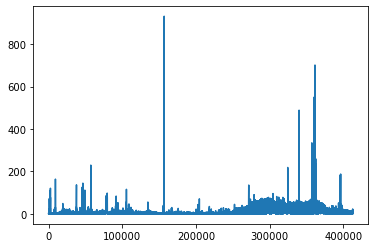

In [6]:
geo_snuffel['pm2_5'].plot()

<AxesSubplot:>

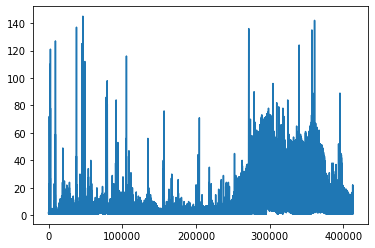

In [7]:
geo_snuffel = geo_snuffel[(geo_snuffel["pm2_5"]>0.5)&(geo_snuffel["pm2_5"]<150)]

geo_snuffel["pm2_5"].plot()

## 3. Removing all measurments with avg. speed >45 km/h.

In [8]:
geo_snuffel = geo_snuffel.sort_values(by=['sensor', 'recording_time'])
geo_snuffel.head()

,sensor,air_quality_observed_id,lon,lat,recording_time,trip_sequence,humidity,pm2_5,pressure,temperature,geometry
98596,0073b711d7702ec73c84ab154468293d,66322765,5.157615,52.033920,2021-04-23 15:26:06,3,54,3,1030,16.9,POINT (5.15762 52.03392)
98578,0073b711d7702ec73c84ab154468293d,66322766,5.157685,52.033424,2021-04-23 15:26:17,3,54,3,1029,16.8,POINT (5.15769 52.03342)
98557,0073b711d7702ec73c84ab154468293d,66322767,5.157691,52.032936,2021-04-23 15:26:28,3,54,3,1029,16.8,POINT (5.15769 52.03294)
98535,0073b711d7702ec73c84ab154468293d,66322768,5.157948,52.032478,2021-04-23 15:26:39,3,54,3,1029,16.8,POINT (5.15795 52.03248)
98513,0073b711d7702ec73c84ab154468293d,66322769,5.157822,52.032051,2021-04-23 15:26:50,3,54,3,1029,16.8,POINT (5.15782 52.03205)


In [9]:
geo_snuffel = geo_snuffel.to_crs("EPSG:3857") # from WGS84 Geographic to WGS84 Projected

geo_snuffel['distance'] = geo_snuffel.distance(geo_snuffel.shift(1)) # distance between two consecutive measurements
geo_snuffel['delta_time'] = geo_snuffel['recording_time'] - geo_snuffel['recording_time'].shift(1) # time_delta between two consecutive measurements
geo_snuffel['speed_ms'] = geo_snuffel['distance'] / geo_snuffel['delta_time'].dt.seconds # avg(v)=x/t
geo_snuffel['speed_kmh'] = geo_snuffel['speed_ms'] * 3.6

geo_snuffel.head()

,sensor,air_quality_observed_id,lon,lat,recording_time,trip_sequence,humidity,pm2_5,pressure,temperature,geometry,distance,delta_time,speed_ms,speed_kmh
98596,0073b711d7702ec73c84ab154468293d,66322765,5.157615,52.033920,2021-04-23 15:26:06,3,54,3,1030,16.9,POINT (574143.096 6806261.003),NaN,NaT,NaN,NaN
98578,0073b711d7702ec73c84ab154468293d,66322766,5.157685,52.033424,2021-04-23 15:26:17,3,54,3,1029,16.8,POINT (574150.899 6806171.268),90.073137,0 days 00:00:11,8.188467,29.478481
98557,0073b711d7702ec73c84ab154468293d,66322767,5.157691,52.032936,2021-04-23 15:26:28,3,54,3,1029,16.8,POINT (574151.483 6806082.915),88.354946,0 days 00:00:11,8.032268,28.916164
98535,0073b711d7702ec73c84ab154468293d,66322768,5.157948,52.032478,2021-04-23 15:26:39,3,54,3,1029,16.8,POINT (574180.094 6806000.085),87.632184,0 days 00:00:11,7.966562,28.679624
98513,0073b711d7702ec73c84ab154468293d,66322769,5.157822,52.032051,2021-04-23 15:26:50,3,54,3,1029,16.8,POINT (574166.133 6805922.778),78.557696,0 days 00:00:11,7.141609,25.709791


In [10]:
geo_snuffel = geo_snuffel[~(geo_snuffel['speed_kmh']>45)]


In [11]:
geo_snuffel['speed_kmh'].describe()


count    353501.000000
mean         11.783852
std          14.422923
min           0.000000
25%           0.511514
50%           1.551455
75%          26.238535
max          44.999623
Name: speed_kmh, dtype: float64

In [12]:
print(round(len(geo_snuffel) / len(snuffel4) * 100, 2), "% measurements remaining after outlier removal (pm2.5 & speed)")

85.6 % measurements remaining after outlier removal (pm2.5 & speed)


## 4. Removing all measurments outside of Utrecht Province.

In [23]:
provinces = gpd.read_file("../data/external/B1_Provinciegrenzen_van_Nederland/B1_Provinciegrenzen_van_NederlandPolygon.shp")

In [14]:
utrecht = provinces[provinces["PROV_NAAM"] == "Utrecht"]

<AxesSubplot:>

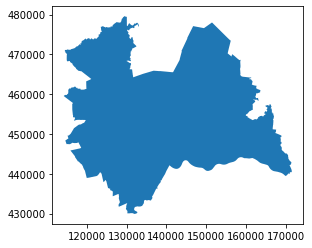

In [15]:
utrecht.plot()

In [16]:
geo_snuffel_amersfoort = geo_snuffel.to_crs("EPSG:28992")

In [17]:
measurments_in_utrecht = gpd.sjoin(geo_snuffel_amersfoort, utrecht, how="inner", op='within')

In [18]:
print(round(len(measurments_in_utrecht) / len(snuffel4) * 100, 2), "% measurements remaining in Utrecht")

25.35 % measurements remaining in Utrecht


<AxesSubplot:>

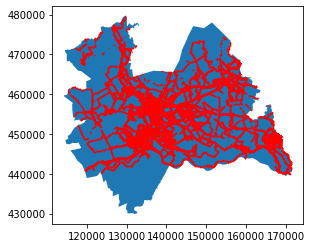

In [19]:
u_plot = utrecht.plot()
measurments_in_utrecht.plot(ax=u_plot, color='red', markersize=0.1)

## 5. Descriptive statistics

In [20]:
measurments_in_utrecht.describe()

,air_quality_observed_id,lon,lat,trip_sequence,humidity,pm2_5,pressure,temperature,distance,delta_time,speed_ms,speed_kmh,index_right,CBS_CODE,OBJECTID
count,1.046850e+05,104685.000000,104685.000000,104685.000000,104685.000000,104685.000000,104685.000000,104685.000000,104684.000000,104684,104684.000000,104684.000000,104685.0,104685.0,104685.0
mean,6.609773e+07,5.176516,52.071786,6.819009,50.851602,8.064680,1018.601223,16.134820,142.134241,0 days 00:00:46.382904741,6.374283,22.947421,4.0,6.0,5.0
std,2.701136e+05,0.162650,0.058209,6.321272,10.112452,9.014243,40.462592,3.795923,2699.667089,0 days 03:47:27.251380696,3.715294,13.375059,0.0,0.0,0.0
min,6.562660e+07,4.807879,51.948380,0.000000,20.000000,1.000000,549.000000,2.300000,0.000000,-7 days +14:20:58,0.000000,0.000000,4.0,6.0,5.0
25%,6.583584e+07,5.066890,52.025059,2.000000,43.000000,2.000000,1016.000000,13.800000,46.772162,0 days 00:00:11,3.497123,12.589644,4.0,6.0,5.0
50%,6.610448e+07,5.132554,52.068081,5.000000,50.000000,4.000000,1021.000000,16.300000,85.486858,0 days 00:00:12,7.355523,26.479882,4.0,6.0,5.0
75%,6.634884e+07,5.250956,52.104008,10.000000,58.000000,11.000000,1029.000000,18.500000,108.061632,0 days 00:00:12,9.229038,33.224536,4.0,6.0,5.0
max,6.650655e+07,5.626285,52.303547,32.000000,87.000000,145.000000,1064.000000,28.200000,308038.413584,4 days 23:54:01,12.499346,44.997647,4.0,6.0,5.0
